In [23]:
include("harvey.jl")
using .julia


using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions


using NLopt

using Plots
using StatsPlots  
using DataFrames
using XLSX

using Dates

## Load data

In [24]:

file_path = "data/quarterly_gdp.xlsx"
sheet_name = "Sheet 1"

data = XLSX.readtable(file_path, sheet_name) |> DataFrame

println(data)

num_obs = size(data, 1)
println("Number of observations: ", num_obs)


134×3 DataFrame
 Row │ Date    Value  recesion 
     │ Any     Any    Any      
─────┼─────────────────────────
   1 │ 1991K1  364.6  1
   2 │ 1991K2  364.7  1
   3 │ 1991K3  368.6  1
   4 │ 1991K4  364.5  1
   5 │ 1992K1  371.5  0
   6 │ 1992K2  367.9  0
   7 │ 1992K3  377.2  0
   8 │ 1992K4  375.4  1
   9 │ 1993K1  371.8  1
  10 │ 1993K2  370    1
  11 │ 1993K3  373.2  0
  12 │ 1993K4  375.7  0
  13 │ 1994K1  385.1  0
  14 │ 1994K2  391.5  0
  15 │ 1994K3  393.3  0
  16 │ 1994K4  399.8  0
  17 │ 1995K1  404.2  0
  18 │ 1995K2  402.5  0
  19 │ 1995K3  404    0
  20 │ 1995K4  406.7  0
  21 │ 1996K1  407.8  0
  22 │ 1996K2  418.3  0
  23 │ 1996K3  419    0
  24 │ 1996K4  419.1  0
  25 │ 1997K1  424.8  0
  26 │ 1997K2  431.6  0
  27 │ 1997K3  429.7  0
  28 │ 1997K4  430.9  0
  29 │ 1998K1  437.5  0
  30 │ 1998K2  434    0
  31 │ 1998K3  441.2  0
  32 │ 1998K4  444.1  0
  33 │ 1999K1  447.8  0
  34 │ 1999K2  449.8  0
  35 │ 1999K3  451.7  0
  36 │ 1999K4  459.7  0
  37 │ 2000K1  462.9  0


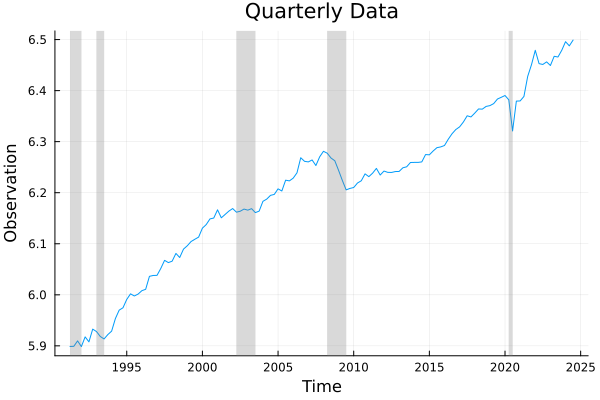

In [25]:
y = data[:, 2]
y = log.(y)
dates = data[:, 1]


for i in 1:length(dates)
    year = parse(Int, dates[i][1:4])
    quarter = parse(Int, dates[i][6])
    dates[i] = year + quarter/4
end

dates = Float64.(dates)


recesion = data[:, 3]
recesion = parse.(Int, recesion) 







# Identify the recession intervals
recession_periods = []
inside_recession = false
start_index = 0


for i in 1:length(recesion)
    if recesion[i] == 1 && !inside_recession
        inside_recession = true
        start_index = i
    elseif recesion[i] == 0 && inside_recession
        inside_recession = false
        push!(recession_periods, (start_index, i-1))
    end
end

if inside_recession
    push!(recession_periods, (start_index, length(recesion)))
end

if inside_recession
    push!(recession_periods, (start_index, length(recesion)))
end

#plot
p = plot(dates, y, title="Quarterly Data", xlabel="Time", ylabel="Observation", label=false)
# Add vertical shaded areas for each recession period
for (start, stop) in recession_periods
    vspan!(p, [dates[start], dates[stop]], fillcolor=:gray, alpha=0.3, label=false)
end

p





In [26]:
#Define model
n_order = 2
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
alpha_init[1] = y[1]
P1 = Matrix{Float64}(I(state_dim))  # Initial covariance matrix

#Priors
a_rho = 0.001
b_rho = 0.97
a_lambda = 0.01 #2
b_lambda = 0.99 #5
a_xi = 1e-6
b_xi =1e6
a_kappa = 1e-6
b_kappa = 1e6
a_epsilon = 1e-6  
b_epsilon = 1e6
priors = [a_rho, b_rho, a_lambda, b_lambda, a_xi, b_xi, a_kappa, b_kappa, a_epsilon, b_epsilon]

# bounds





10-element Vector{Float64}:
 0.001
 0.97
 0.01
 0.99
 1.0e-6
 1.0e6
 1.0e-6
 1.0e6
 1.0e-6
 1.0e6

In [27]:
# Run MCMC initialization
chain_init_burned, Sigma, acceptance_rate_init, chain_init = initialize_mcmc(
    y,
    priors,
    alpha_init, 
    P1, 
    n_order; 
    n_init=40000, 
    burn_init=20000, 
    omega_init=0.15)


Initialization Phase 100%|███████████████████████████████| Time: 0:00:39


Initialization Acceptance Rate: 29.372500000000002 %


([-0.760477947469391 -2.4729600788338777 … -22.831013237177707 -26.034585340203524; -0.760477947469391 -2.4729600788338777 … -22.831013237177707 -26.034585340203524; … ; 1.0857153694809656 -5.096578630486698 … -24.066887928805436 -23.686370064447303; 1.0857153694809656 -5.096578630486698 … -24.066887928805436 -23.686370064447303], [0.3372728082083931 -0.3198480738796554 … -0.13784798139930043 0.18778474018331023; -0.3198480738796554 2.8075138626983733 … 0.06681046541717264 -0.15507321018846706; … ; -0.13784798139930043 0.06681046541717264 … 0.16936382300367417 -0.13098165042493662; 0.18778474018331023 -0.15507321018846706 … -0.13098165042493662 0.25400028681398545], 0.293725, [-0.2500904139194024 -0.5667148221751832 … -0.08430133336231334 0.19064593461544696; -0.2500904139194024 -0.5667148221751832 … -0.08430133336231334 0.19064593461544696; … ; 1.0857153694809656 -5.096578630486698 … -24.066887928805436 -23.686370064447303; 1.0857153694809656 -5.096578630486698 … -24.066887928805436 -

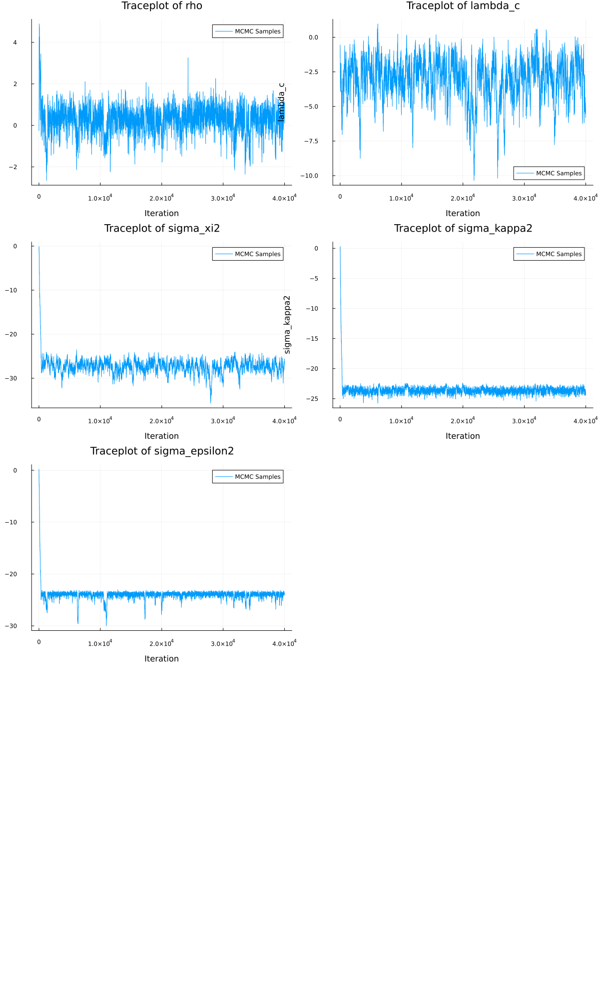

In [28]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples_init = chain_init[:, i]
    
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples_init, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")

    
    # Add plots to the list
    push!(p_list, p2)
end

# Display the plots
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [29]:
# Run MCMC recursion
theta_samples_burned, alpha_samples, acceptance_rate_rec = recursion_mcmc(
    y, 
    priors,
    alpha_init, 
    P1, 
    n_order, 
    chain_init_burned, 
    Sigma; 
    n_rec=40000, 
    burn_rec=20000, 
    omega_rec=0.55)


Recursion Phase 100%|████████████████████████████████████| Time: 0:01:28


Recursion Acceptance Rate: 31.81 %


([0.5212913529452067 0.10633585340122767 … 7.556202730195439e-5 2.3388977745647392e-5; 0.5212913529452067 0.10633585340122767 … 7.556202730195439e-5 2.3388977745647392e-5; … ; 0.623562315247038 0.023178937564274374 … 5.838403137931077e-5 4.971915291962069e-5; 0.623562315247038 0.023178937564274374 … 5.838403137931077e-5 4.971915291962069e-5], Any[[5.880384198637847 0.005559955623405055 … 0.010814601821497356 0.5298677953027765; 5.885944154261175 0.00372996133109893 … 0.011200158331468202 0.3593341831825129; … ; 6.490247728410964 0.004066719530738061 … 0.00308294836436109 0.031185320932337036; 6.494314447941697 0.006928050883051207 … 0.004008685972625137 0.03130175775466905], [5.968311755567623 -0.005465242185520802 … -0.06766582202408011 -1.5816342450746868; 5.962846513382382 -0.0047692611330794055 … -0.055336026139323535 -1.012575756136475; … ; 6.482365255375399 0.0029910177002798743 … 0.007222247981971455 0.0033280183616364884; 6.485356273075681 0.002815642716494593 … 0.0142419776490

In [30]:

# Initial guesses for parameters
initial_params = [0.75, 0.5, 1e-5, 1e-5, 1e-5]

# Bounds for parameters
lower_bounds = [0.0, 0.0, 1e-9, 1e-9, 1e-9]
upper_bounds = [0.999, π, Inf, Inf, Inf]


# Define the objective function
function obj(params::Vector, grad::Vector)
    try
        return negative_log_likelihood(params, y, alpha_init, P1, n_order)
    catch e
        return 1e10  # Return a large number in case of error
    end
end

# Create the optimizer
opt = Opt(:LN_NELDERMEAD, length(initial_params))
opt.lower_bounds = lower_bounds
opt.upper_bounds = upper_bounds
opt.min_objective = obj
opt.maxeval = 1000000
opt.xtol_rel = 1e-10

# Run the optimization
(minf, estimated_params, ret) = NLopt.optimize(opt, initial_params)

# Display the estimated parameters
println("Estimated Parameters: ", estimated_params)
println("Minimum Objective Function: ", minf)
println("Return Code: ", ret)


Estimated Parameters: [0.6759794780982266, 1.601713146917683e-8, 4.953486046610799e-7, 4.377627262838863e-5, 4.734511649841794e-5]
Minimum Objective Function: -380.56328940729185
Return Code: XTOL_REACHED


In [31]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)




5

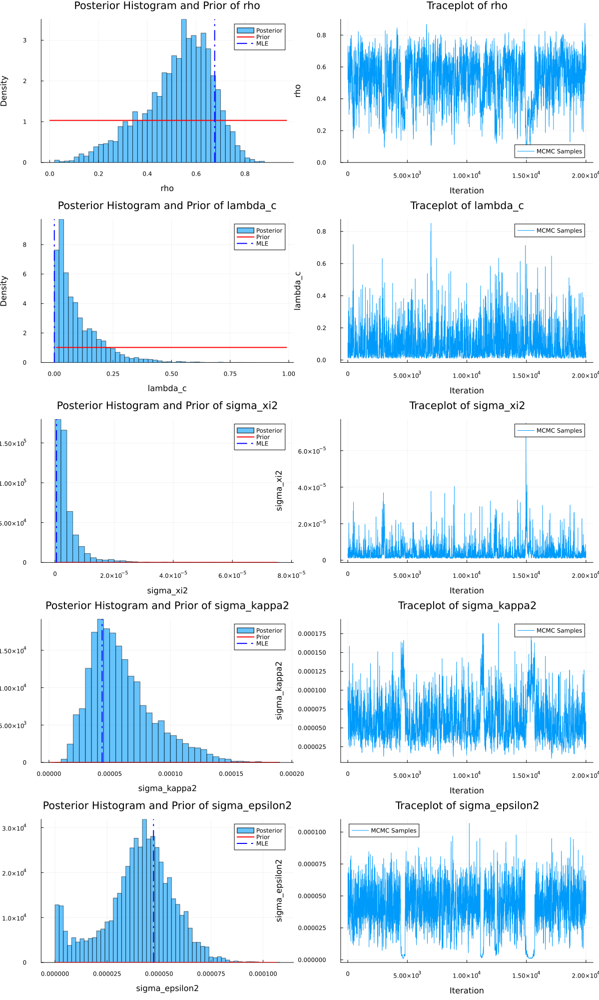

"c:\\Users\\marti\\OneDrive - University of Copenhagen\\Økonomi\\9. semester\\Empirical macro\\State-Space-Model-Estimation-1\\Harvey\\results\\harvey_estimation.pdf"

In [32]:
# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples = theta_samples_burned[:, i]
    
    # Histogram of posterior samples
    p1 = histogram(param_samples, bins=50, normalize=true, alpha=0.6,
                   label="Posterior", xlabel=parameters[i], ylabel="Density",
                   title="Posterior Histogram and Prior of $(parameters[i])")
    
    # Define the prior distribution
    if parameters[i] == "rho"
        # Uniform prior between 0 and 0.999
        x_values = range(a_rho, b_rho, length=200)
        prior_pdf = pdf.(Uniform(a_rho, b_rho), x_values)
    elseif parameters[i] == "lambda_c"
        # beta distribution
        x_values = range(a_lambda, b_lambda, length=200)
        prior_pdf = pdf.(Uniform(a_lambda, b_lambda), x_values)
        # x_values = range(0.0, 1.0, length=200)
        # prior_pdf = pdf.(Beta(a_lambda, b_lambda), x_values)
    elseif parameters[i] == "sigma_xi2"
        # Inverse Gamma prior
        x_values = range(0.0, maximum(param_samples), length=200)
        prior_pdf = pdf.(InverseGamma(a_xi, b_xi), x_values)
    elseif parameters[i] == "sigma_kappa2"
        # Inverse Gamma prior
        x_values = range(0.0, maximum(param_samples), length=200)
        prior_pdf = pdf.(InverseGamma(a_kappa, b_kappa), x_values)
    elseif parameters[i] == "sigma_epsilon2"
        # Inverse Gamma prior
        x_values = range(0.0, maximum(param_samples), length=200)
        prior_pdf = pdf.(InverseGamma(a_epsilon, b_epsilon), x_values)
    end
    
    # prior PDF 
    plot!(p1, x_values, prior_pdf, label="Prior", color=:red, linewidth=2)

     # MLE estimate
     vline!(p1, [estimated_params[i]], label="MLE", color=:blue, linestyle=:dashdot, linewidth=2)
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")

    
    # Add plots to the list
    push!(p_list, p1)
    push!(p_list, p2)
end

# Display the plots 
nrows = n_params
ncols = 2
recursion_plot = plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))
display(recursion_plot)
savefig(recursion_plot, "results/harvey_estimation.pdf")




In [33]:
# Calculate means of posterior samples
chain_rec_burned_means = mean(theta_samples_burned, dims=1)  # 1 x n_params array
chain_rec_burned_means = vec(chain_rec_burned_means)  # Convert to a vector


5-element Vector{Float64}:
 0.5240755285217008
 0.09979571176858369
 4.088663723390625e-6
 6.016677651174759e-5
 4.008264019304962e-5

In [34]:

# Create the DataFrame
estimates_table = DataFrame(Dict(
    "Parameter" => parameters,
    "MCMC Estimate" => chain_rec_burned_means,
    # "MLE Estimate" => estimated_params,  # Include if available
    # "True Value" => params_true
))

# Display the DataFrame
display(estimates_table)


Row,MCMC Estimate,Parameter
,Float64,String
1,0.524076,rho
2,0.0997957,lambda_c
3,4.08866e-6,sigma_xi2
4,6.01668e-5,sigma_kappa2
5,4.00826e-5,sigma_epsilon2


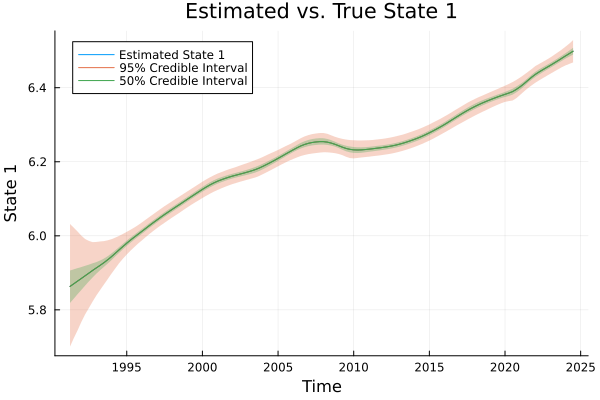

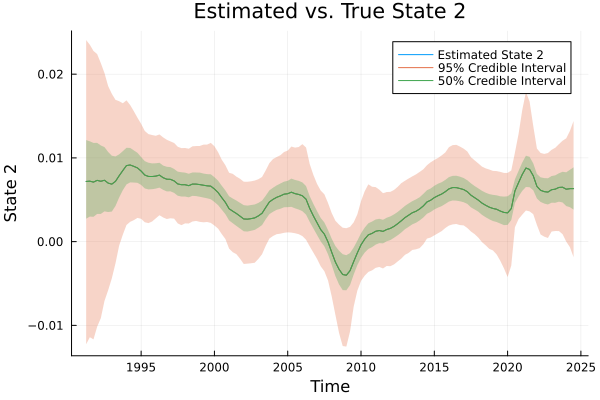

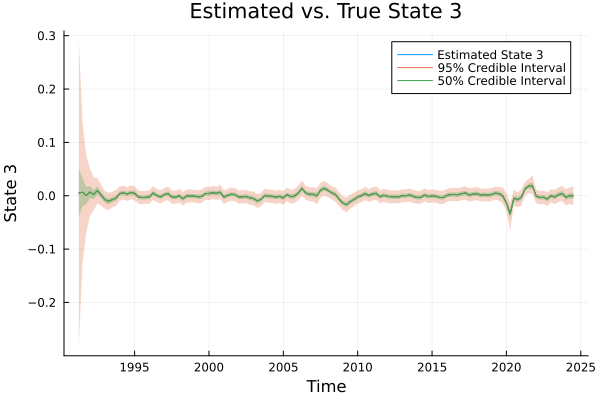

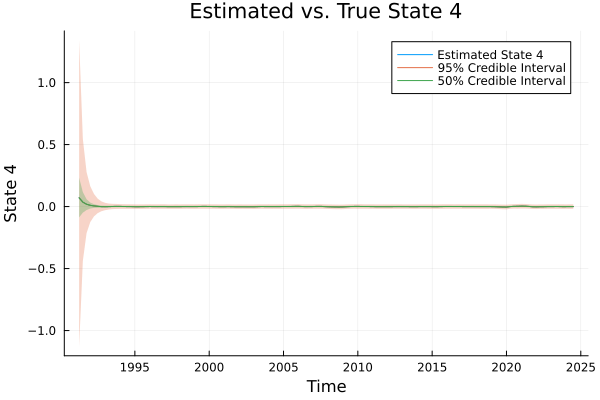

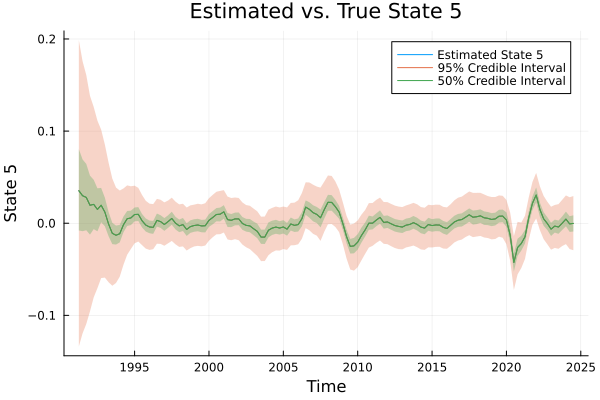

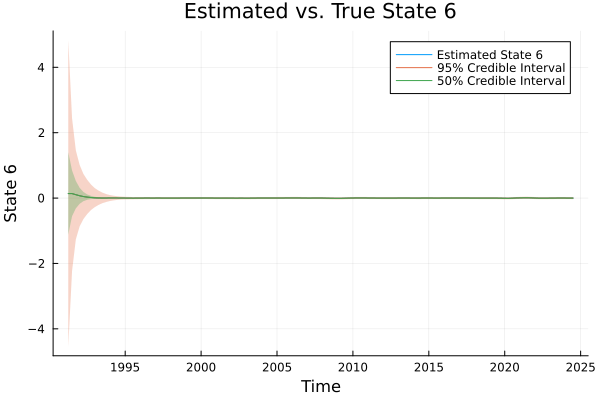

In [35]:
# Collect alpha samples into a 3D array
n_samples = length(alpha_samples)
n_time_steps = size(alpha_samples[1], 1)
state_dim = size(alpha_samples[1], 2)

dates_plot = dates


# Initialize array to hold alpha samples
alpha_samples_array = Array{Float64}(undef, n_samples, n_time_steps, state_dim)

for i in 1:n_samples
    alpha_samples_array[i, :, :] = alpha_samples[i]
end


# Compute posterior mean over samples (dimension 1)
alpha_mean = mean(alpha_samples_array, dims=1)  # 1 x n_time_steps x state_dim
alpha_mean = dropdims(alpha_mean; dims=1)  # n_time_steps x state_dim

# Compute credible intervals 95 percent coverage
alpha_lower = mapslices(x -> quantile(x, 0.025), alpha_samples_array; dims=1)
alpha_lower = dropdims(alpha_lower; dims=1)
alpha_upper = mapslices(x -> quantile(x, 0.975), alpha_samples_array; dims=1)
alpha_upper = dropdims(alpha_upper; dims=1)

#compute credible intervals 68 percent coverage
alpha_lower_68 = mapslices(x -> quantile(x, 0.25), alpha_samples_array; dims=1)
alpha_lower_68 = dropdims(alpha_lower_68; dims=1)
alpha_upper_68 = mapslices(x -> quantile(x, 0.75), alpha_samples_array; dims=1)
alpha_upper_68 = dropdims(alpha_upper_68; dims=1)



time = 1:n_time_steps

for s in 1:state_dim
    p = plot(dates_plot, alpha_mean[:, s], label="Estimated State $(s)", xlabel="Time",
             ylabel="State $(s)", title="Estimated vs. True State $(s)")
    
    # Add credible intervals
    plot!(dates_plot, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower[:, s],
          alpha_upper[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="95% Credible Interval")
    plot!(dates_plot, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower_68[:, s],
          alpha_upper_68[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="50% Credible Interval")
  
    display(p)
end


In [36]:
using JLD2

# Save the states to a JLD2 file
@save "results/states_harvey.jld2" alpha_mean alpha_lower alpha_upper alpha_lower_68 alpha_upper_68 



(134,)
(134,)


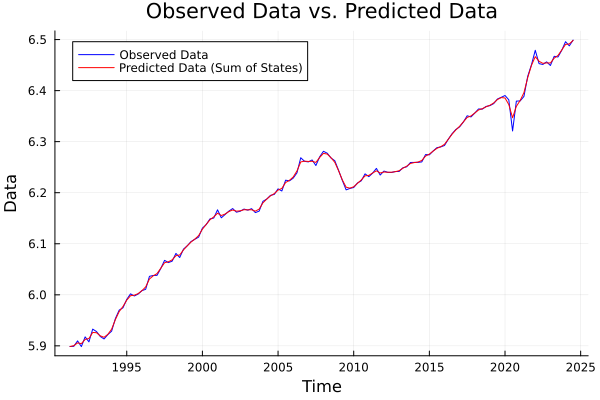

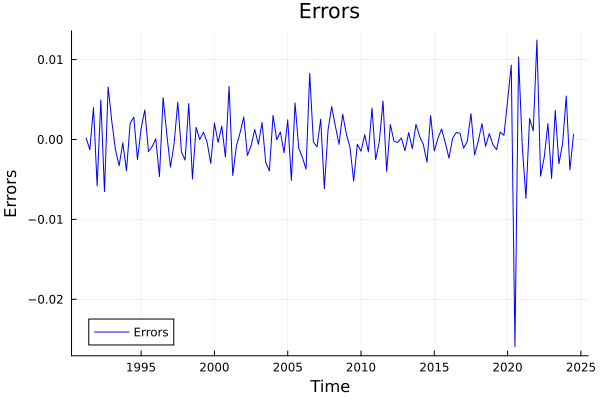

In [37]:
# Compute y_pred

state_indices = [1, 2+2*n_order-1] 

y_pred = alpha_mean[:, state_indices[1]] .+ alpha_mean[:, state_indices[2]]


# Adjust time and observed data if necessary
y_adjusted = y

println(size(y))
println(size(y_pred))

p = plot(dates_plot, y_adjusted, label="Observed Data", color=:blue)
plot!(p, dates_plot, y_pred, label="Predicted Data (Sum of States)", color=:red)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Data")
display(p)


errors = y_adjusted .- y_pred

p_error = plot(dates_plot, errors, label="Errors", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)


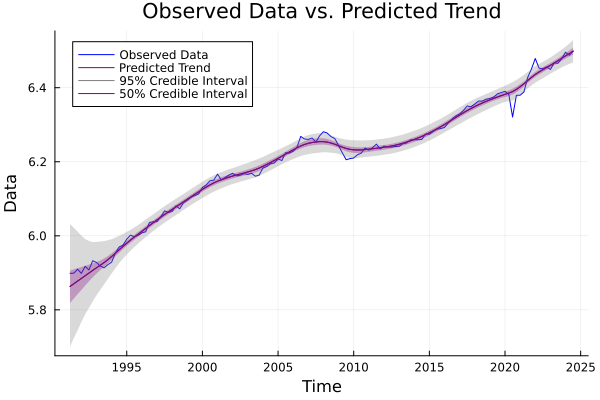

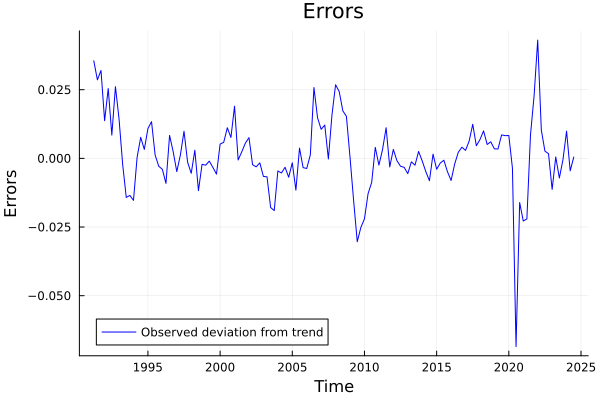

In [38]:




state_indices = [1, 2+2*n_order-1]  

y_pred = alpha_mean[:, state_indices[1]] 


# Adjust time and observed data if necessary
y_adjusted = y

p = plot(dates_plot, y_adjusted, label="Observed Data", color=:blue)
plot!(p, dates_plot, y_pred, label="Predicted Trend", color=:purple)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Trend")

# Add credible intervals using the `ribbon` argument
plot!(dates_plot, y_pred, ribbon=(alpha_mean[:, state_indices[1]] .- alpha_lower[:, state_indices[1]],
      alpha_upper[:, state_indices[1]] .- alpha_mean[:, state_indices[1]]), fillalpha=0.3, label="95% Credible Interval", color=:grey)

# add 68% credible interval
plot!(dates_plot, y_pred, ribbon=(alpha_mean[:, state_indices[1]] .- alpha_lower_68[:, state_indices[1]],
      alpha_upper_68[:, state_indices[1]] .- alpha_mean[:, state_indices[1]]), fillalpha=0.3, label="50% Credible Interval", color=:purple)

display(p)


errors = y_adjusted .- y_pred


p_error = plot(dates_plot, errors, label="Observed deviation from trend", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)


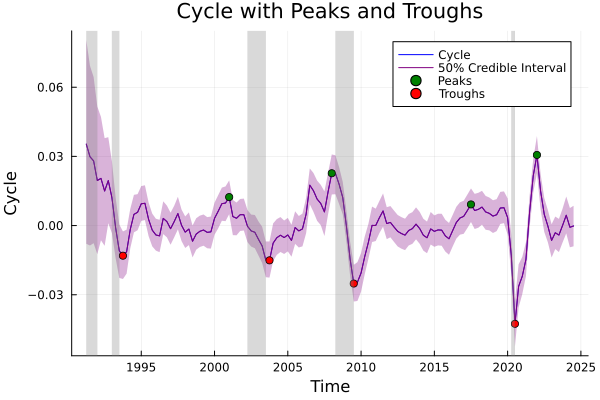

In [39]:
#Identifying peaks and troughs in the cycle
cycle = alpha_mean[:, end-1]
cycle_lower = alpha_lower_68[:, end-1]
cycle_upper = alpha_upper_68[:, end-1]



# Identify where cycle crosses zero
zero_crossings = findall(i -> cycle_upper[i]*cycle_upper[i+1] < 0, 1:length(cycle)-1)
# add last index to zero crossings
push!(zero_crossings, length(cycle))



# Identify peaks and troughs between zero-crossings
peaks = []
peak_indices = []
troughs = []
trough_indices = []

for i in 1:(length(zero_crossings)-1)
    # Define the segment between zero crossings
    start_idx = zero_crossings[i] + 1
    end_idx   = zero_crossings[i+1]
    segment = cycle[start_idx:end_idx]

    # Find local maximum (peak) in this interval
    max_val = maximum(segment)
    max_idx = argmax(segment) + start_idx - 1  # Convert segment index to full index
    
    # Find local minimum (trough) in this interval
    min_val = minimum(segment)
    min_idx = argmin(segment) + start_idx - 1

    



    # check if absolute value of trough is bigger than peak
    if (abs(min_val) > abs(max_val))
        push!(troughs, min_val)
        push!(trough_indices, min_idx)
    end
    if (abs(max_val) > abs(min_val))
        push!(peaks, max_val)
        push!(peak_indices, max_idx)
    end

end

#plot the cycle with peaks and troughs
p = plot(dates_plot, cycle, label="Cycle", color=:blue)

# add credible intervals
plot!(dates_plot, cycle, ribbon=(cycle .- cycle_lower, cycle_upper .- cycle), fillalpha=0.3, label="50% Credible Interval", color=:purple)

# add peaks and troughs
scatter!(p, dates_plot[peak_indices], peaks, label="Peaks", color=:green)
scatter!(p, dates_plot[trough_indices], troughs, label="Troughs", color=:red)
xlabel!("Time")
ylabel!("Cycle")
title!("Cycle with Peaks and Troughs")

for (start, stop) in recession_periods
    vspan!(p, [dates[start], dates[stop]], fillcolor=:gray, alpha=0.3, label=false)
end



display(p)




In [40]:

expansion_durations = Float64[]
contraction_durations = Float64[]
expansion_amplitudes = Float64[]
contraction_amplitudes = Float64[]


peak_to_peak_durations = Float64[]
trough_to_trough_durations = Float64[]


num_cycles = min(length(peak_indices), length(trough_indices))


for i in 1:(num_cycles) 
    # Expansion: trough[i] to peak[i]
    exp_dur = dates_plot[peak_indices[i]] - dates_plot[trough_indices[i]]
    push!(expansion_durations, exp_dur)
    exp_amp = peaks[i]
    push!(expansion_amplitudes, exp_amp)
    con_amp = troughs[i]
    push!(contraction_amplitudes, con_amp)
end

for i in 1:(num_cycles-1)
    # Contraction: peak[i] to trough[i+1]
    con_dur = dates_plot[trough_indices[i+1]] - dates_plot[peak_indices[i]]
    push!(contraction_durations, con_dur)
end

# For full cycle durations (peak-to-peak and trough-to-trough):
for i in 1:(length(peak_indices)-1)
    p2p = dates_plot[peak_indices[i+1]] - dates_plot[peak_indices[i]]
    push!(peak_to_peak_durations, p2p)
end

for i in 1:(length(trough_indices)-1)
    t2t = dates_plot[trough_indices[i+1]] - dates_plot[trough_indices[i]]
    push!(trough_to_trough_durations, t2t)
end

println("Expansion Durations: ", expansion_durations)
println("Contraction Durations: ", contraction_durations)
println("Peak-to-Peak Durations: ", peak_to_peak_durations)
println("Trough-to-Trough Durations: ", trough_to_trough_durations)
println("Expansion Amplitudes: ", expansion_amplitudes)
println("Contraction Amplitudes: ", contraction_amplitudes)


# Average characteristics:
avg_expansion_duration = mean(expansion_durations)
avg_contraction_duration = mean(contraction_durations)
avg_peak_to_peak_duration = mean(peak_to_peak_durations)
avg_trough_to_trough_duration = mean(trough_to_trough_durations)
avg_expansion_amplitude = mean(expansion_amplitudes)
avg_contraction_amplitude = mean(contraction_amplitudes)

println("Average Expansion Duration: ", avg_expansion_duration)
println("Average Contraction Duration: ", avg_contraction_duration)
println("Average Peak-to-Peak Duration: ", avg_peak_to_peak_duration)
println("Average Trough-to-Trough Duration: ", avg_trough_to_trough_duration)
println("Average Expansion Amplitude: ", avg_expansion_amplitude)
println("Average Contraction Amplitude: ", avg_contraction_amplitude)


# time with significantly positive and negative cycle
count_above = count(x -> x > 0, cycle_lower)
count_below = count(x -> x < 0, cycle_upper)

println("Quarters with significantly positive cycle: ", count_above)
println("Quarters with significantly negative cycle: ", count_below)





Expansion Durations: [7.25, 4.25, 8.0, 1.5]
Contraction Durations: [2.75, 1.5, 3.0]
Peak-to-Peak Durations: [7.0, 9.5, 4.5]
Trough-to-Trough Durations: [10.0, 5.75, 11.0]
Expansion Amplitudes: [0.012357670344703156, 0.02268719108361641, 0.009169068181596197, 0.030625996900740148]
Contraction Amplitudes: [-0.013071948595079727, -0.015089629860793057, -0.02515618915255932, -0.04261737810853313]
Average Expansion Duration: 5.25
Average Contraction Duration: 2.4166666666666665
Average Peak-to-Peak Duration: 7.0
Average Trough-to-Trough Duration: 8.916666666666666
Average Expansion Amplitude: 0.01870998162766398
Average Contraction Amplitude: -0.02398378642924131
Quarters with significantly positive cycle: 22
Quarters with significantly negative cycle: 15


In [41]:
# #Identifying peaks and troughs in the cycle
# cycle = alpha_mean[:, end-1]
# cycle_lower = alpha_lower_68[:, end-1]
# cycle_upper = alpha_upper_68[:, end-1]


# # Identify where cycle crosses zero
# zero_crossings = findall(i -> cycle[i]*cycle[i+1] < 0, 1:length(cycle)-1)
# # add last index to zero crossings
# push!(zero_crossings, length(cycle))

# # Identify peaks and troughs between zero-crossings
# peaks = []
# peak_indices = []
# troughs = []
# trough_indices = []


# last_extremum = nothing

# for i in 1:(length(zero_crossings)-1)
#     # Define the segment between zero crossings
#     start_idx = zero_crossings[i] + 1
#     end_idx   = zero_crossings[i+1]
#     segment = cycle[start_idx:end_idx]

#     # Find local maximum (peak) in this interval
#     max_val = maximum(segment)
#     max_idx = argmax(segment) + start_idx - 1

#     # Find local minimum (trough) in this interval
#     min_val = minimum(segment)
#     min_idx = argmin(segment) + start_idx - 1

#     # Determine which extremum is dominant in this segment
#     # and enforce alternation and threshold
#     if abs(min_val) > abs(max_val)
#         # We have a trough candidate
#         if last_extremum != :trough && abs(min_val) > 0.005
#             push!(troughs, min_val)
#             push!(trough_indices, min_idx)
#             last_extremum = :trough
#         end
#     elseif abs(max_val) > abs(min_val)
#         # We have a peak candidate
#         if last_extremum != :peak && abs(max_val) > 0.006
#             push!(peaks, max_val)
#             push!(peak_indices, max_idx)
#             last_extremum = :peak
#         end
#     end
# end


# #plot the cycle with peaks and troughs
# p = plot(dates_plot, cycle, label="Cycle", color=:blue)

# # add credible intervals
# plot!(dates_plot, cycle, ribbon=(cycle .- cycle_lower, cycle_upper .- cycle), fillalpha=0.3, label="68% Credible Interval", color=:purple)

# # add peaks and troughs
# scatter!(p, dates_plot[peak_indices], peaks, label="Peaks", color=:green)
# scatter!(p, dates_plot[trough_indices], troughs, label="Troughs", color=:red)
# xlabel!("Time")
# ylabel!("Cycle")
# title!("Cycle with Peaks and Troughs")


# display(p)


In [42]:

# expansion_durations = Float64[]
# contraction_durations = Float64[]
# expansion_amplitudes = Float64[]
# contraction_amplitudes = Float64[]


# peak_to_peak_durations = Float64[]
# trough_to_trough_durations = Float64[]


# num_cycles = min(length(peak_indices), length(trough_indices))


# for i in 1:(num_cycles) 
#     # Expansion: trough[i] to peak[i]
#     exp_dur = dates_plot[peak_indices[i]] - dates_plot[trough_indices[i]]
#     push!(expansion_durations, exp_dur)
#     exp_amp = peaks[i]
#     push!(expansion_amplitudes, exp_amp)
#     con_amp = troughs[i]
#     push!(contraction_amplitudes, con_amp)
# end

# for i in 1:(num_cycles)
#     # Contraction: peak[i] to trough[i+1]
#     con_dur = dates_plot[trough_indices[i+1]] - dates_plot[peak_indices[i]]
#     push!(contraction_durations, con_dur)
# end

# # For full cycle durations (peak-to-peak and trough-to-trough):
# for i in 1:(length(peak_indices)-1)
#     p2p = dates_plot[peak_indices[i+1]] - dates_plot[peak_indices[i]]
#     push!(peak_to_peak_durations, p2p)
# end

# for i in 1:(length(trough_indices)-1)
#     t2t = dates_plot[trough_indices[i+1]] - dates_plot[trough_indices[i]]
#     push!(trough_to_trough_durations, t2t)
# end

# println("Expansion Durations: ", expansion_durations)
# println("Contraction Durations: ", contraction_durations)
# println("Peak-to-Peak Durations: ", peak_to_peak_durations)
# println("Trough-to-Trough Durations: ", trough_to_trough_durations)
# println("Expansion Amplitudes: ", expansion_amplitudes)
# println("Contraction Amplitudes: ", contraction_amplitudes)


# # Average characteristics:
# avg_expansion_duration = mean(expansion_durations)
# avg_contraction_duration = mean(contraction_durations)
# avg_peak_to_peak_duration = mean(peak_to_peak_durations)
# avg_trough_to_trough_duration = mean(trough_to_trough_durations)
# avg_expansion_amplitude = mean(expansion_amplitudes)
# avg_contraction_amplitude = mean(contraction_amplitudes)

# println("Average Expansion Duration: ", avg_expansion_duration)
# println("Average Contraction Duration: ", avg_contraction_duration)
# println("Average Peak-to-Peak Duration: ", avg_peak_to_peak_duration)
# println("Average Trough-to-Trough Duration: ", avg_trough_to_trough_duration)
# println("Average Expansion Amplitude: ", avg_expansion_amplitude)
# println("Average Contraction Amplitude: ", avg_contraction_amplitude)


# # time with positve and negative cycle
# count_above = count(x -> x > 0, cycle)
# count_below = count(x -> x < 0, cycle)

# println("Quarters with positive cycle: ", count_above)
# println("Quarters with negative cycles: ", count_below)

# # time with significantly positive and negative cycle
# count_above = count(x -> x > 0, cycle_lower)
# count_below = count(x -> x < 0, cycle_upper)

# println("Quarters with significantly positive cycle: ", count_above)
# println("Quarters with significantly negative cycles: ", count_below)



